In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from urllib.request import urlopen
import json
import calmap
np.random.seed(42)

In [2]:
df = pd.read_csv("data/Police_Department_Incident_Reports__Historical_2003_to_May_2018_20240127.csv") 
df.head(5)

,PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,...,Fix It Zones as of 2017-11-06 2 2,DELETE - HSOC Zones 2 2,Fix It Zones as of 2018-02-07 2 2,"CBD, BID and GBD Boundaries as of 2017 2 2","Areas of Vulnerability, 2016 2 2",Central Market/Tenderloin Boundary 2 2,Central Market/Tenderloin Boundary Polygon - Updated 2 2,HSOC Zones as of 2018-06-05 2 2,OWED Public Spaces 2 2,Neighborhoods 2
0,4133422003074,41334220,3074,ROBBERY,"ROBBERY, BODILY FORCE",Monday,11/22/2004,17:50,INGLESIDE,NONE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5118535807021,51185358,7021,VEHICLE THEFT,STOLEN AUTOMOBILE,Tuesday,10/18/2005,20:00,PARK,NONE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4018830907021,40188309,7021,VEHICLE THEFT,STOLEN AUTOMOBILE,Sunday,02/15/2004,02:00,SOUTHERN,NONE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,11014543126030,110145431,26030,ARSON,ARSON,Friday,02/18/2011,05:27,INGLESIDE,NONE,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,94.0
4,10108108004134,101081080,4134,ASSAULT,BATTERY,Sunday,11/21/2010,17:00,SOUTHERN,NONE,...,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,32.0


## Exercise: Questions from DAOST Chapter 3 ##

**Looking at Fig 3-1, Janert writes "the data itself shows clearly that the amount of random noise in the data is small". What do you think his argument is?**

I think, the argument seems to be that the data points demonstrate a systematic relationship between variables x and y, rather than being widely scattered in a way that would indicate a high degree of randomness or noise. The data points do not appear to be randomly distributed across the plotting area; instead, they seem to form clusters or follow some sort of pattern, although the exact nature of this pattern is not immediately clear. Moreover, the variations in y for a given x are relatively small and consistent, which suggests there could be a meaningful relationship. This relationship could be further investigated with more complex statistical or machine learning models to discover the underlying pattern or function that describes the connection between x and y.

**Can you think of a real-world example of a multivariate relationship like the one in Fig 3-3 (lower right panel)?**

Yes, i think, the lower right panel in Figure 3-3 seems to illustrate a multivariate relationship, where a single outcome is influenced by multiple independent variables.This type of relationship is common in many real-world scenarios.One example of a multivariate relationship in the real-world can be seen in the field of health outcomes, specifically in the relationship between lifestyle factors, genetic predisposition, and the risk of developing a chronic disease such as diabetes.

In this scenario, the outcome variable (risk of developing diabetes) is influenced by multiple independent variables, including:

1. Diet: The consumption of sugar, carbohydrates, fiber, and overall caloric intake can influence blood sugar levels and insulin sensitivity.
2. Exercise: Physical activity levels have a direct impact on metabolism and insulin sensitivity.
3. Body Weight: Body mass index (BMI) is a well-known risk factor for diabetes.
4. Genetic Factors: Certain gene variants can increase or decrease risk independently of lifestyle factors.
5. Age: Risk of developing diabetes increases with age.
6. Stress and Sleep Patterns: Chronic stress and poor sleep can affect hormone levels and insulin sensitivity.

In a multivariate analysis, researchers would try to understand how these factors interact with one another to influence the risk of diabetes. For instance, the impact of diet might be different for individuals with a high genetic risk compared to those with a lower genetic risk. Similarly, exercise might be more protective against diabetes for individuals who are overweight than for those who are not.

The complex interplay of these factors could be visualized in a scatter plot with multiple dimensions (not all of which can be captured in a two-dimensional plot). Each point would represent an individual's combined profile of these variables and their associated risk of developing diabetes. The pattern might reveal clusters of high and low risk based on the interactions between lifestyle and genetic factors.

**What are the two methods Janert metions for smoothing noisy data? Can you think of other ones?**

The two methods for smoothing noisy data that Janert mentions are:

1. oving Average (or Rolling Average): This method smooths out short-term fluctuations and highlights longer-term trends or cycles. The moving average is calculated by taking the arithmetic mean of a given set of values. For example, a 7-day moving average is calculated by taking the average of 7 days' data, and then "rolling" forward by one day.

3. Kernel Smoothing (or Kernel Density Estimation): This is a more sophisticated form of smoothing that weights nearby observations higher than those further away. A kernel function is used to assign weights, and different kernel functions can be used to achieve different smoothing effects.

**What are residuals? Why is it a good idea to plot the residuals of your fit?**

Residuals in the context of statistical modeling, machine learning, or data fitting are the differences between observed values and the values predicted by a model. For each data point, the residual is calculated as:

Residual = Observed Value − Predicted Value

Here's why it's a good idea to plot the residuals of your fit:

1. Assumption Checking:

    1. Linearity: Residual plots can show whether the relationship between the variables is linear. If the residuals display a non-random pattern (like a curve), it suggests nonlinearity.
    2. Constant Variance (Homoscedasticity): Residuals should be spread equally across all levels of the independent variables. If the spread of residuals increases or decreases with the fitted values, it indicates heteroscedasticity.
    3. Independence: Observations should be independent of each other. Patterns in the residual plot can indicate that residuals are not independent.
2. Identifying Outliers: Residual plots can help to identify outliers — data points with large residuals, meaning they are far from the regression line.
3. Model Fit: They can show how well the model fits the data. Ideally, the residuals should be randomly scattered around zero, indicating that the model's predictions are accurate across all values.
4. Error Distribution: The distribution of residuals can indicate whether the errors (residuals) are normally distributed, which is an assumption in many statistical models.
5. Improving Models: Plotting residuals can help in improving the model. For example, if a residual plot shows a pattern, it might suggest that a key variable is missing, or that you need to transform a variable, or include interaction terms.

**Explain in your own words the point of the smooth tube in figure 3-7.**

The smooth tube helps to communicate the central tendency and the variability of the data in a single visualization, making it easier to understand the data's behavior over time.

The purpose of this smooth tube is to provide a visual representation of the variability or dispersion of the data around the central trend. It serves several purposes:

1. Trend Visualization: The solid line indicates the overall trend of the data, showing how the men's marathon results have changed over time. This helps to identify the general direction and shape of the data's movement.

2. Variability Insight: The dashed lines encapsulate the range where the majority of the data points lie. This offers a clear visualization of the spread of the data around the central trend, giving insight into the consistency of the performance over the years.

3. Outlier Detection: Points that fall outside of the smooth tube may be considered outliers or exceptional cases that do not follow the general pattern. This is useful for identifying data points that warrant further investigation.

4. Confidence or Prediction Intervals: While not explicitly stated as such, this smooth tube can be akin to a confidence or prediction interval, which provides a range within which future data points are expected to fall, given the current data.

**What the h#ll is banking and what part of our visual system does it use to help us see patterns? What are potential problems with banking?**

Banking, or "banking to 45 degrees," is a technique applied to graphs by adjusting the aspect ratio of the entire plot to make the slopes of curves approximate a 45-degree angle. This approach leverages the human visual system's ability to detect changes more easily when slopes are angled at about 45 degrees, as steeper or flatter angles can make it harder to perceive changes​.

However, there are potential problems with banking. If taken too literally, it can lead to an aspect ratio that is too skewed, which might not be helpful or could distort the interpretation of the data. In such cases, it might be better to reconsider the design of the graph entirely. Sometimes, no amount of banking can correct a graph's appearance; instead, a different transformation, like a double logarithmic transform, might be necessary

**Summarize the discussion of Graphical Analysis and Presentation Graphics on pp. 68-69 in your own words.**

Graphical analysis is the use of visual methods to explore and discover new information within a data set, often without a preconceived question. It's a dynamic process of creating various unpolished graphs to view data from multiple angles. Presentation graphics, by contrast, involve the polished communication of already understood results. The distinction is crucial as each requires different approaches and serves different purposes in data analysis and communication.

## Exercise 2.2: Logarithms and logarithmic plots. ##

**What kind of relationships will a semi-log plot help you discover?**

A semi-log plot is useful for discovering exponential relationships in data. By using a logarithmic scale for one axis (usually the y-axis) and a linear scale for the other (the x-axis), exponential relationships are transformed into linear relationships, which are easier to recognize and analyze.

For example, if you have a dataset where the y-values increase exponentially as the x-values increase linearly, a semi-log plot will straighten the curve of the data into a line. This is particularly helpful in scenarios such as:

1. Population growth: Where the population grows exponentially over time.
2. Radioactive decay: Where the quantity of a substance decreases exponentially over time.
3. Interest compounding: Where investment grows exponentially at a constant interest rate.
4. Microbial growth: Where bacteria or other organisms multiply at a rate proportional to their current population.

By converting the exponential growth curve to a straight line, a semi-log plot allows for easier identification of the rate of growth or decay, which corresponds to the slope of the line in the transformed plot.

**What kind of functions will loglog plots help you see?**

Log-log plots are used to visualize data where both the independent variable (x-axis) and the dependent variable (y-axis) follow a power-law distribution or some other non-linear relationship that can be linearized by logarithmic scales. Both axes are on a logarithmic scale in a log-log plot.

This type of plot is helpful for seeing:

1. Power Laws: If the relationship between the two variables is of the form y=axk, then a log-log plot will display this as a straight line with slope k.

2. Scaling Laws: Phenomena where one quantity varies as a power of another, which is common in physical sciences and economics.

3. Fractal Dimensions: In phenomena characterized by self-similarity over multiple scales, such as in fractal patterns.

4. Earthquake Magnitude and Frequency: The Gutenberg-Richter law for earthquakes, which states that the frequency of earthquakes decreases exponentially with increased magnitude, appears as a straight line on a log-log plot.

By linearizing the relationship between the variables, log-log plots make it easier to determine the exponent in the power-law relationship and to compare the relative rates of change between different datasets.

***Second, create a version of this plot from Week 1, where you display the 
-axis on log-scale. Comment on what the plot looks like. Do any new insights arise?***

In [3]:
data = df.copy()

In [4]:
categories = data['Category'].unique()
categories

array(['ROBBERY', 'VEHICLE THEFT', 'ARSON', 'ASSAULT', 'TRESPASS',
       'BURGLARY', 'LARCENY/THEFT', 'WARRANTS', 'OTHER OFFENSES',
       'DRUG/NARCOTIC', 'SUSPICIOUS OCC', 'LIQUOR LAWS', 'VANDALISM',
       'WEAPON LAWS', 'NON-CRIMINAL', 'MISSING PERSON', 'FRAUD',
       'SEX OFFENSES, FORCIBLE', 'SECONDARY CODES', 'DISORDERLY CONDUCT',
       'RECOVERED VEHICLE', 'KIDNAPPING', 'FORGERY/COUNTERFEITING',
       'PROSTITUTION', 'DRUNKENNESS', 'BAD CHECKS',
       'DRIVING UNDER THE INFLUENCE', 'LOITERING', 'STOLEN PROPERTY',
       'SUICIDE', 'BRIBERY', 'EXTORTION', 'EMBEZZLEMENT', 'GAMBLING',
       'PORNOGRAPHY/OBSCENE MAT', 'SEX OFFENSES, NON FORCIBLE', 'TREA'],
      dtype=object)

In [5]:
total_category = data['Category'].nunique()
total_category

37

In [6]:
category_number_of_crimes = data['Category'].value_counts()
# category_number_of_crimes[0]

In [7]:
crime_counts = category_number_of_crimes.sort_values(ascending=False)
crime_counts

Category
LARCENY/THEFT                  477975
OTHER OFFENSES                 301874
NON-CRIMINAL                   236928
ASSAULT                        167042
VEHICLE THEFT                  126228
DRUG/NARCOTIC                  117821
VANDALISM                      114718
WARRANTS                        99821
BURGLARY                        91067
SUSPICIOUS OCC                  79087
ROBBERY                         54467
MISSING PERSON                  44268
FRAUD                           41348
FORGERY/COUNTERFEITING          22995
SECONDARY CODES                 22378
WEAPON LAWS                     21004
TRESPASS                        19194
PROSTITUTION                    16501
STOLEN PROPERTY                 11450
DISORDERLY CONDUCT               9932
DRUNKENNESS                      9760
SEX OFFENSES, FORCIBLE           8747
RECOVERED VEHICLE                8688
DRIVING UNDER THE INFLUENCE      5652
KIDNAPPING                       4282
ARSON                            3875
EMB

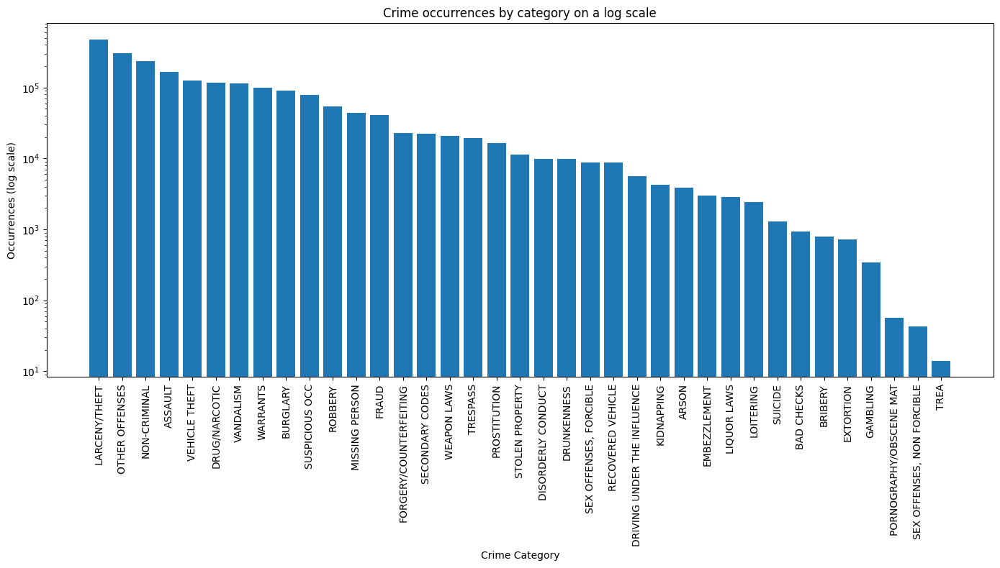

In [8]:
# Create a bar plot with a log-scaled y-axis
plt.figure(figsize=(14, 8))
plt.bar(crime_counts.index, crime_counts.values)
plt.yscale('log')
plt.xticks(rotation=90)
plt.xlabel('Crime Category')
plt.ylabel('Occurrences (log scale)')
plt.title('Crime occurrences by category on a log scale')
plt.tight_layout() 
plt.show()

**Third, let's also try a loglog plot. Inspired by this article I would expect that especially theft could be characterized by a power law distribution also in San Francisco.**

In [9]:
 crime_counts.values[0]

477975

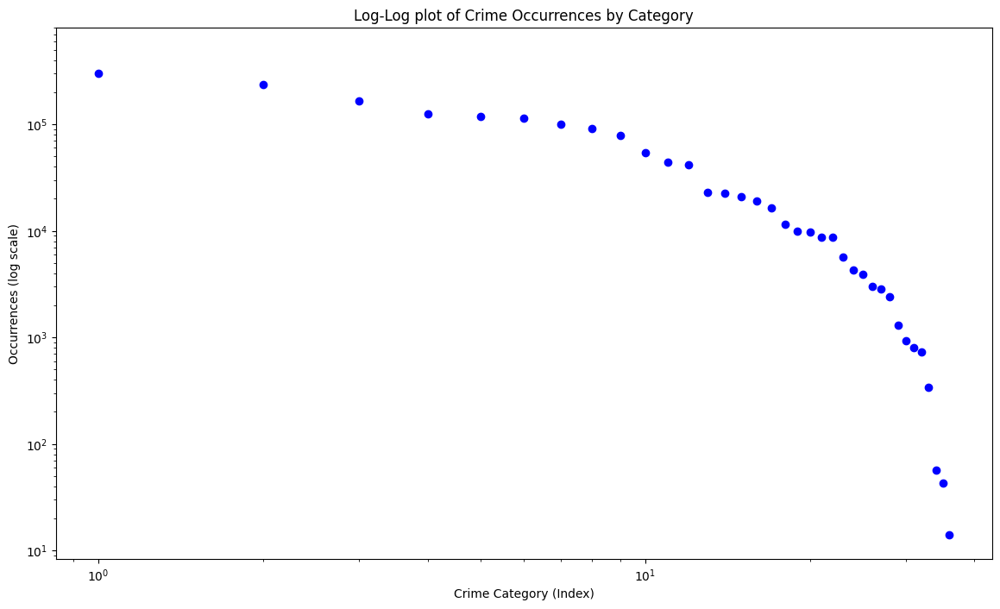

In [10]:
# Correcting the code to use the updated parameters for the log scale
plt.figure(figsize=(14, 8))

# Plot all categories in blue
plt.loglog(range(total_category), crime_counts.values, linestyle='', marker='o', color='b')

# Highlight the 'THEFT' category in red
theft_index = 0 
plt.loglog(theft_index, crime_counts.values[theft_index], linestyle='', marker='o', color='r', markersize=10)

# Annotate the 'THEFT' category
plt.annotate('LARCENY/THEFT', (theft_index, crime_counts.values[theft_index]), textcoords="offset points", xytext=(-15,10), ha='center')

# Set labels and title
plt.xlabel('Crime Category (Index)')
plt.ylabel('Occurrences (log scale)')
plt.title('Log-Log plot of Crime Occurrences by Category')

# Show the plot
plt.show()


In [11]:
# Filter the dataset for theft incidents
theft_df = df[df['Category'] == 'LARCENY/THEFT']
theft_df.head(5)

,PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,...,Fix It Zones as of 2017-11-06 2 2,DELETE - HSOC Zones 2 2,Fix It Zones as of 2018-02-07 2 2,"CBD, BID and GBD Boundaries as of 2017 2 2","Areas of Vulnerability, 2016 2 2",Central Market/Tenderloin Boundary 2 2,Central Market/Tenderloin Boundary Polygon - Updated 2 2,HSOC Zones as of 2018-06-05 2 2,OWED Public Spaces 2 2,Neighborhoods 2
11,12620267506244,126202675,6244,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Friday,12/21/2012,19:15,CENTRAL,NONE,...,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,104.0
16,10018088906362,100180889,6362,LARCENY/THEFT,PETTY THEFT SHOPLIFTING,Tuesday,02/23/2010,17:57,SOUTHERN,"ARREST, CITED",...,18.0,NaN,18.0,5.0,2.0,NaN,NaN,NaN,35.0,32.0
19,12601807406374,126018074,6374,LARCENY/THEFT,GRAND THEFT OF PROPERTY,Monday,02/06/2012,18:00,MISSION,NONE,...,NaN,5.0,NaN,9.0,1.0,NaN,NaN,5.0,NaN,28.0
21,4072574106112,40725741,6112,LARCENY/THEFT,GRAND THEFT PICKPOCKET,Saturday,05/22/2004,15:00,NORTHERN,NONE,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,26.0
25,12607802806372,126078028,6372,LARCENY/THEFT,PETTY THEFT OF PROPERTY,Saturday,06/02/2012,13:00,NORTHERN,NONE,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,27.0


In [12]:
# Define reasonable bounds for San Francisco
lat_bounds = (37.707922, 37.787159)
lon_bounds = (-122.513642, -122.406064)

# Filter out the outlier data points
filtered_df = theft_df[
    (theft_df['Y'] >= lat_bounds[0]) & (theft_df['Y'] <= lat_bounds[1]) &
    (theft_df['X'] >= lon_bounds[0]) & (theft_df['X'] <= lon_bounds[1])
]

# Calculate the number of bins for latitude and longitude
lat_distance = 111000  # meters per degree of latitude
lon_distance = 88649  # meters per degree of longitude at San Francisco's latitude (~37.7749°N)
grid_size = 100  # Desired grid square size in meters

lat_range = lat_bounds[1] - lat_bounds[0]
lon_range = lon_bounds[1] - lon_bounds[0]

lat_bins = int(lat_range / (grid_size / lat_distance))
lon_bins = int(lon_range / (grid_size / lon_distance))


# Now let's recompute the histogram with the filtered data
H, lat_edges, lon_edges = np.histogram2d(
    filtered_df['Y'], filtered_df['X'], 
    bins=[lat_bins, lon_bins], 
    range=[lat_bounds, lon_bounds]
)
H

array([[0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        1.000e+01],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 1.700e+01,
        3.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 1.800e+01, 1.500e+01,
        1.000e+01],
       ...,
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 2.780e+02, 1.280e+03,
        4.130e+03],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 2.500e+01, 1.703e+03,
        8.980e+02],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 2.070e+02, 3.231e+03,
        9.210e+02]])

In [13]:
grid_counts = H.flatten()

# Use np.unique to tally the counts of thefts across grid squares
n_thefts, count_squares = np.unique(grid_counts, return_counts=True)

In [14]:
# Exclude the zero count for log-log plot
non_zero_indices = n_thefts > 0

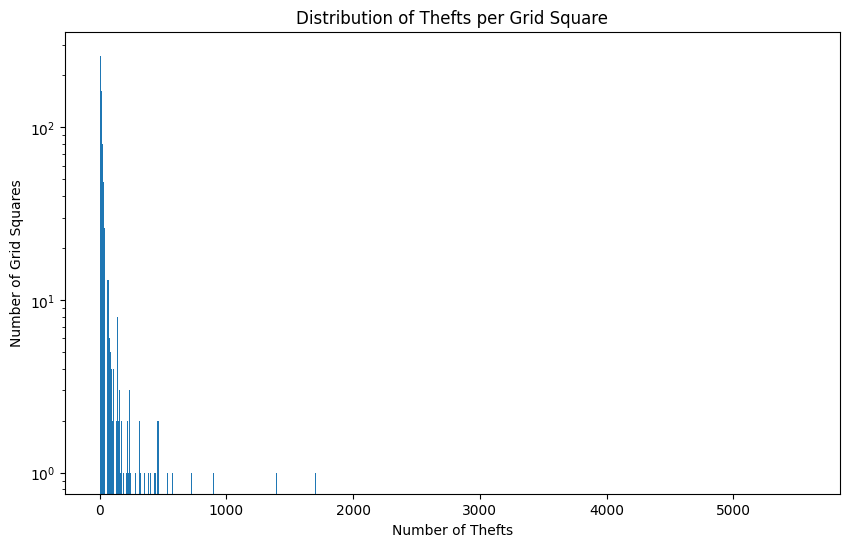

In [15]:
plt.figure(figsize=(10, 6))
plt.bar(n_thefts[non_zero_indices], count_squares[non_zero_indices], width=0.8)
plt.xlabel('Number of Thefts')
plt.ylabel('Number of Grid Squares')
plt.title('Distribution of Thefts per Grid Square')
plt.yscale('log')
plt.show()

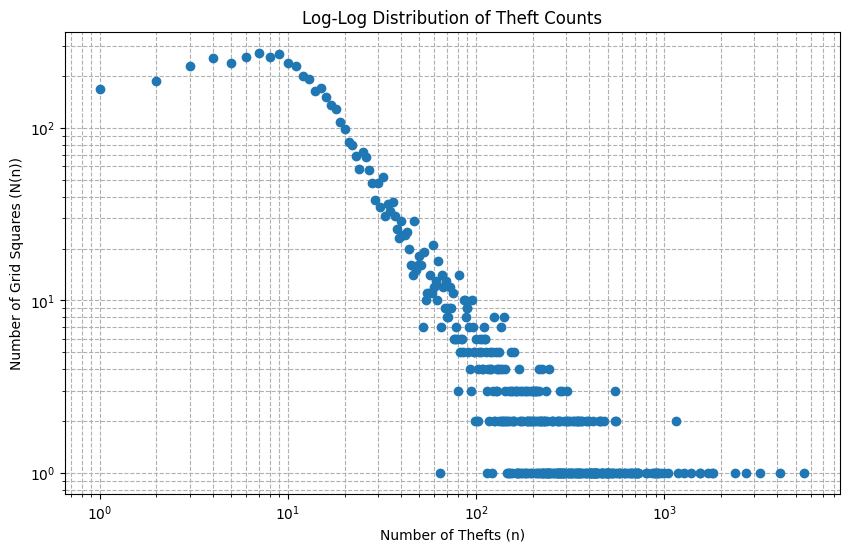

In [16]:


# Plot the distribution on log-log axes
plt.figure(figsize=(10, 6))
plt.loglog(n_thefts[non_zero_indices], count_squares[non_zero_indices], marker='o', linestyle='none')
plt.xlabel('Number of Thefts (n)')
plt.ylabel('Number of Grid Squares (N(n))')
plt.title('Log-Log Distribution of Theft Counts')
plt.grid(True, which="both", ls="--")
plt.show()

## Part 2: Linear Regression ##

In [17]:
focuscrimes = set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT', 'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT', 'STOLEN PROPERTY', 'DISORDERLY CONDUCT'])

In [18]:
df2 = df.copy()

In [19]:
df2['DateTime'] = pd.to_datetime(df2['Date'] + ' ' + df2['Time'])

In [20]:
df2['HourOfWeek'] = df2['DateTime'].dt.dayofweek * 24 + df2['DateTime'].dt.hour

In [21]:
crime_counts = {crime: [0] * 168 for crime in focuscrimes}  # 168 hours in a week
for crime in focuscrimes:
    # Count occurrences of each crime type for each hour of the week
    crime_data = df2[df2['Category'] == crime]
    counts = crime_data.groupby('HourOfWeek').size()
    for hour, count in counts.items():
        crime_counts[crime][hour] = count
# crime_counts

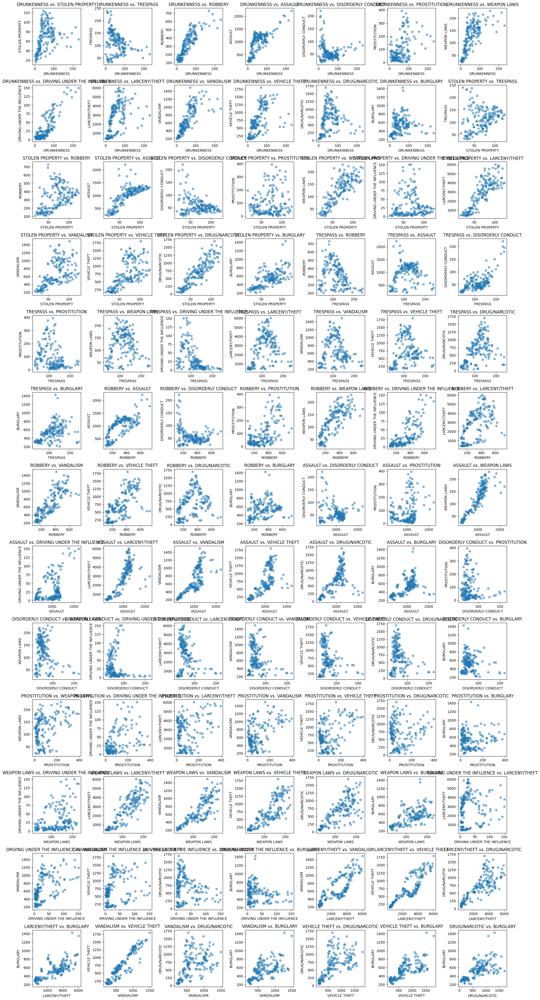

In [22]:
import itertools
# Set up the subplot grid
fig, axes = plt.subplots(13, 7, figsize=(20, 40))  
plt.subplots_adjust(hspace=0.5, wspace=0.5)

# Generate all pairwise combinations of focus crimes
pairs = list(itertools.combinations(focuscrimes, 2))

for i, (crime1, crime2) in enumerate(pairs):
    ax = axes[i // 7, i % 7]
    ax.scatter(crime_counts[crime1], crime_counts[crime2], alpha=0.5)
    ax.set_xlabel(crime1)
    ax.set_ylabel(crime2)
    ax.set_title(f'{crime1} vs. {crime2}')

# Hide any unused subplot areas
for j in range(i + 1, 13 * 7):
    fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

Axes: Each plot has one crime type on the x-axis and another on the y-axis. The number of incidents for the crime type on the x-axis is plotted against the number on the y-axis for each hour of the week.

Points: Each point in a scatter plot represents an hour of the week. For example, a point far out along the x-axis indicates an hour during which the crime type on the x-axis was particularly prevalent.

Correlation: If the points in a scatter plot form a line or cluster along a line, this suggests a correlation between the occurrences of the two crime types: as one increases, so does the other. If the points are widely scattered, it indicates that there's no clear relationship between the occurrences of the two crime types.

Dense Clusters: Areas with a dense cluster of points indicate time periods during which the counts of both crime types are consistently similar.

Outliers: Points that are far removed from the main cluster may indicate unusual hours where a particular crime was much higher or lower than typical patterns.

By visually inspecting these scatter plots, you can infer which crimes tend to occur together (indicating a potential correlation) and which ones do not. For example, if you see a plot where points form a distinct diagonal line from the bottom left to the top right, this suggests a strong positive correlation, meaning that as incidents of one crime increase, so do incidents of the other.

**Exercise: Linear regression.**

In [23]:
pairs = list(itertools.combinations(focuscrimes, 2))

/home/kazi/Works/Dtu/socialdata/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


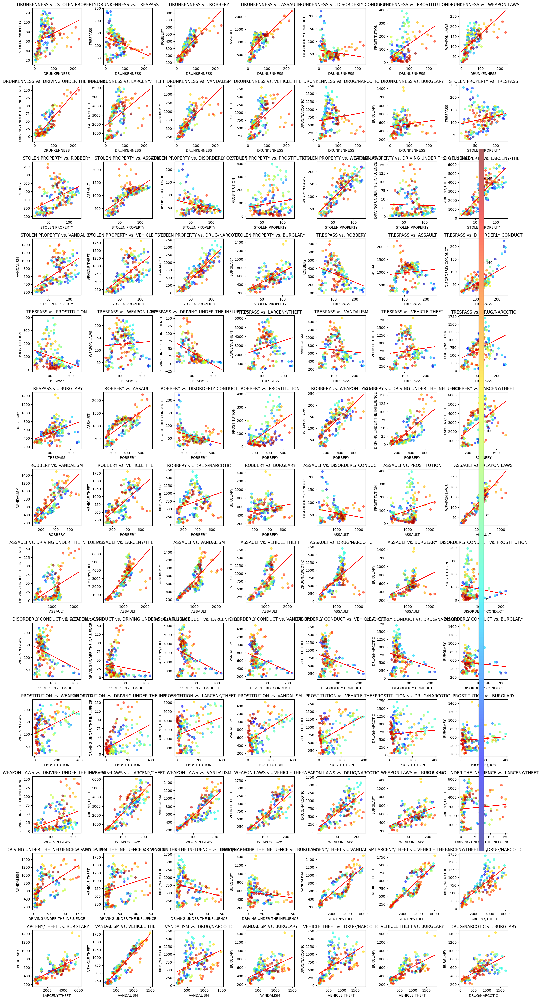

In [24]:
# Set up the subplot grid
fig, axes = plt.subplots(13, 7, figsize=(20, 40), tight_layout=True)

# Define a colormap for the hours of the week
cmap = plt.get_cmap('jet')

for i, (crime1, crime2) in enumerate(pairs):
    ax = axes[i // 7, i % 7]
    x = crime_counts[crime1]
    y = crime_counts[crime2]
    colors = [cmap(hour / 167) for hour in range(168)]  # Color gradient

    # Scatter plot for the crimes, colored by hour of week
    scatter = ax.scatter(x, y, c=range(168), cmap='jet', alpha=0.6)

    # Perform linear regression
    slope, intercept = np.polyfit(x, y, 1)
    ax.plot(x, slope*np.array(x) + intercept, color='red')  # Regression line

    # Set labels and title
    ax.set_xlabel(crime1)
    ax.set_ylabel(crime2)
    ax.set_title(f'{crime1} vs. {crime2}')

# Add a color bar
cbar_ax = fig.add_axes([0.93, 0.15, 0.01, 0.7]) 
fig.colorbar(scatter, cax=cbar_ax, orientation='vertical')

# Hide any unused subplot areas
for j in range(i + 1, 13 * 7):
    fig.delaxes(axes.flatten()[j])

plt.show()

**Exercise: Goodness of fit as a measure of correlation.**

In [25]:
def calculate_r_squared(y_obs, y_pred):
    ss_res = np.sum((y_obs - y_pred) ** 2)
    ss_tot = np.sum((y_obs - np.mean(y_obs)) ** 2)
    r_squared = 1 - (ss_res / ss_tot)
    return r_squared

**Explain the connection between and the Pearson correlation coefficient**

The R2 value, or coefficient of determination, tells us how well a linear model explains the variability of the data. The Pearson correlation coefficient (r) measures the linear relationship between two variables. R2 is the square of r in simple linear regression, meaning it transforms the correlation into a value that represents the percentage of the data's variance that the linear model explains. While r indicates the direction and strength of a linear relationship, R2 quantifies how accurately the model predicts the dependent variable.

/home/kazi/Works/Dtu/socialdata/venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.canvas.print_figure(bytes_io, **kw)


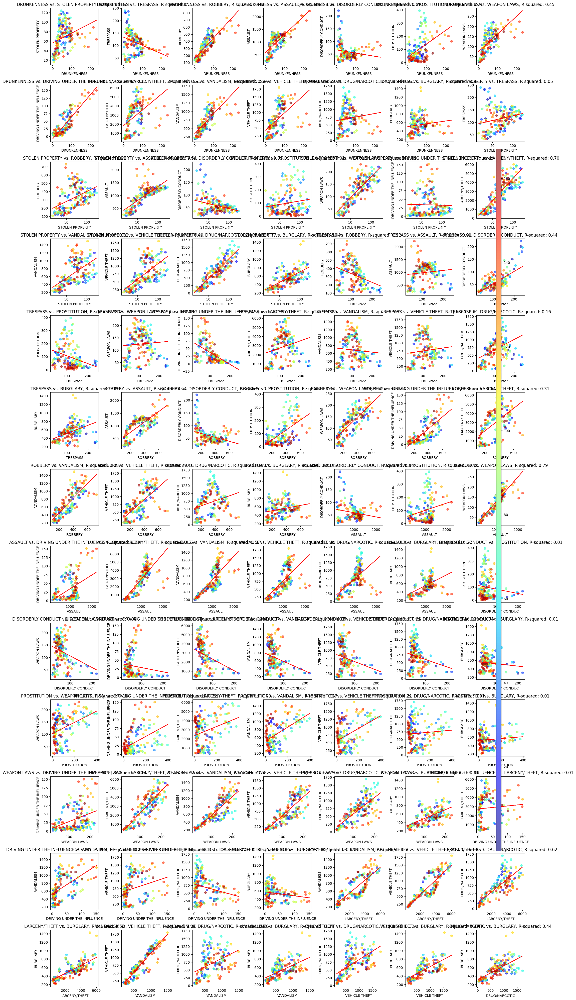

In [31]:
from sklearn.metrics import r2_score

pairs = list(itertools.combinations(focuscrimes, 2))

# Set up the subplot grid
fig, axes = plt.subplots(13, 7, figsize=(20, 40), tight_layout=True)

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5, wspace=0.5)

# Define a colormap for the hours of the week
cmap = plt.get_cmap('jet')

for i, (crime1, crime2) in enumerate(pairs):
    ax = axes[i // 7, i % 7]
    x = crime_counts[crime1]
    y = crime_counts[crime2]
    colors = [cmap(hour / 167) for hour in range(168)]  # Color gradient

    # Scatter plot for the crimes, colored by hour of week
    scatter = ax.scatter(x, y, c=range(168), cmap='jet', alpha=0.6)

    # Perform linear regression
    slope, intercept = np.polyfit(x, y, 1)
    ax.plot(x, slope * np.array(x) + intercept, color='red')  # Regression line

    # Calculate R^2 value
    r_squared = r2_score(y, slope * np.array(x) + intercept)

    # Set labels and title
    ax.set_xlabel(crime1)
    ax.set_ylabel(crime2)
    ax.set_title(f'{crime1} vs. {crime2}, R-squared: {r_squared:.2f}')

# Add a color bar
cbar_ax = fig.add_axes([0.93, 0.15, 0.01, 0.7])
fig.colorbar(scatter, cax=cbar_ax, orientation='vertical')

# Hide any unused subplot areas
for j in range(i + 1, 13 * 7):
    fig.delaxes(axes.flatten()[j])
plt.show()

**mega-plot with all of the 91 megaplots**

In [34]:
from sklearn.linear_model import LinearRegression

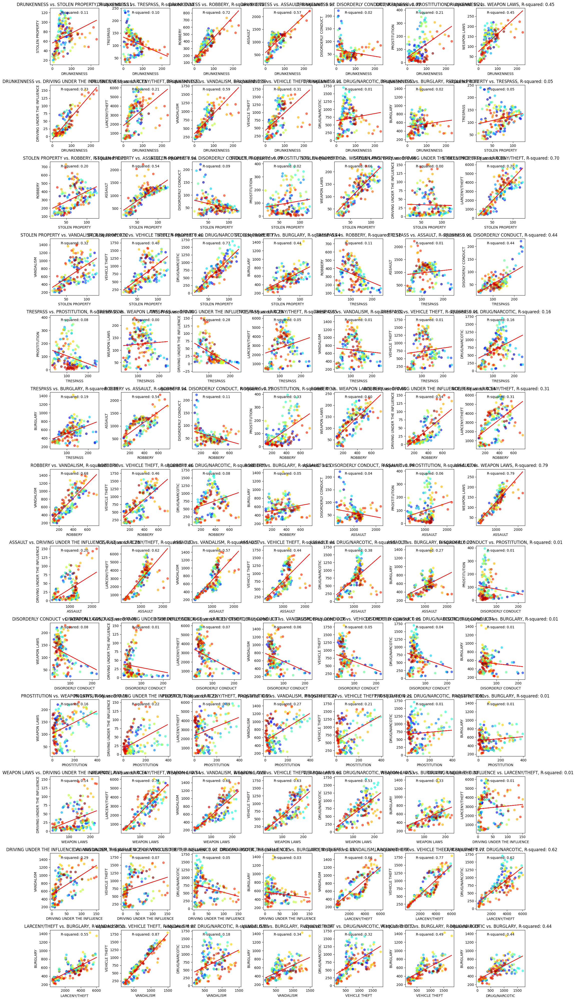

Most Similar Pair: ('VANDALISM', 'VEHICLE THEFT') with R-squared: 0.87
Most Dissimilar Pair: ('STOLEN PROPERTY', 'DRIVING UNDER THE INFLUENCE') with R-squared: 0.00


In [35]:
# Set up the subplot grid
fig, axes = plt.subplots(13, 7, figsize=(20, 40))

# Define a colormap for the hours of the week
cmap = plt.get_cmap('jet')

# Initialize variables to store the most similar and dissimilar pairs
max_similar_pair = None
max_dissimilar_pair = None
max_similar_r2 = -1
max_dissimilar_r2 = 2

for i, (crime1, crime2) in enumerate(pairs):
    ax = axes[i // 7, i % 7]
    x = crime_counts[crime1]
    y = crime_counts[crime2]

    # Scatter plot for the crimes, colored by hour of the week
    scatter = ax.scatter(x, y, c=range(168), cmap='jet', alpha=0.6)

    # Perform linear regression
    model = LinearRegression()
    model.fit(np.array(x).reshape(-1, 1), y)
    y_pred = model.predict(np.array(x).reshape(-1, 1))

    # Calculate R-squared value
    r_squared = r2_score(y, y_pred)

    # Plot the regression line
    ax.plot(x, y_pred, color='red')

    # Set labels and title
    ax.set_xlabel(crime1)
    ax.set_ylabel(crime2)
    ax.set_title(f'{crime1} vs. {crime2}, R-squared: {r_squared:.2f}')

    # Add R-squared value as text on the plot
    ax.text(0.5, 0.9, f'R-squared: {r_squared:.2f}', transform=ax.transAxes, ha='center')

    # Update most similar and dissimilar pairs
    if r_squared > max_similar_r2:
        max_similar_r2 = r_squared
        max_similar_pair = (crime1, crime2)
    if r_squared < max_dissimilar_r2:
        max_dissimilar_r2 = r_squared
        max_dissimilar_pair = (crime1, crime2)

# Show the plot
plt.tight_layout()
plt.show()

# Print the most similar and dissimilar pairs
print(f"Most Similar Pair: {max_similar_pair} with R-squared: {max_similar_r2:.2f}")
print(f"Most Dissimilar Pair: {max_dissimilar_pair} with R-squared: {max_dissimilar_r2:.2f}")